# SourceREACH

# Source REconstruction of Arcs behind Cluster Halos


Companion source reconstruction code for Eid and Keeton (2026): https://iopscience.iop.org/article/10.3847/1538-4357/ae6105

----------------------------------------------------------------------------------------------------------------

[Utilizes cluster model optimized in Eid and Keeton (2025): https://iopscience.iop.org/article/10.3847/1538-4357/adf4cb]

[Hubble Frontier Fields described in Lotz et al. (2017): https://ui.adsabs.harvard.edu/abs/2017ApJ...837...97L/abstract]

[Utilizes data originally obtained from Hubble Frontier Fields: https://archive.stsci.edu/prepds/frontier/]

IMPORTS

In [2]:
#Below are the imports used for both this notebook + previous work leading up to it, included for completeness:

import numpy
from matplotlib.pyplot import *
import matplotlib.colors as colors
import astropy
from astropy.visualization import astropy_mpl_style
from astropy.visualization import make_lupton_rgb
from astropy.utils.data import get_pkg_data_filename
from astropy.io import fits
from astropy.modeling.models import Sersic2D
from astropy.cosmology import FlatLambdaCDM
from skimage import img_as_float
import imageio
from pathlib import Path
from PIL import Image
from astropy import wcs
from astropy.wcs import WCS
import matplotlib.gridspec as gridspec
from astropy.coordinates import Angle,SkyCoord
import astropy.coordinates as coord
import math
import astropy.units as u
from scipy.stats import norm
from scipy.interpolate import RectBivariateSpline
from photutils.detection import find_peaks
from astropy.stats import sigma_clipped_stats
from astropy.nddata import NDData
from photutils.psf import extract_stars
from astropy.visualization import simple_norm
from photutils.psf import EPSFBuilder
from photutils.psf import epsf_stars
import photutils.psf.epsf_stars
from photutils.psf import EPSFStar
import photutils
from astropy import convolution
from astropy.convolution import convolve
from astropy.nddata import Cutout2D
from astropy.utils.data import download_file
from astropy.wcs import WCS
from photutils.isophote import EllipseGeometry, Ellipse, build_ellipse_model
from photutils.aperture import EllipticalAperture
import aplpy
from photutils.datasets import make_noise_image
from astropy.io import ascii
from astropy.utils import data
from spectral_cube import SpectralCube
import scipy.interpolate as interp
import astropy.units as u
from astropy.utils import data
from astropy.utils.data import get_pkg_data_filename
from spectral_cube import SpectralCube
from matplotlib.backends.backend_pdf import PdfPages
import sys
from reproject import reproject_interp
from scipy import signal
from scipy.signal import convolve2d
from skimage import restoration
from scipy.signal import convolve as convolve_sci
from scipy.interpolate import griddata
import pyregion
from sklearn.neighbors import KNeighborsRegressor
import scipy
from scipy.interpolate import RBFInterpolator
from reproject import reproject_interp
from astropy.visualization.wcsaxes import add_scalebar
import time
from sklearn.gaussian_process.kernels import RBF
from sklearn.ensemble import RandomForestRegressor
from pdf2image import convert_from_path
import cv2
from regions import Regions
from mpl_toolkits.axes_grid1 import make_axes_locatable
# import pygravlens as gl

matplotlib.style.use(astropy_mpl_style)
cosmo = FlatLambdaCDM(H0=70, Om0=0.3)#would need Ode0=0.7 if using LambdaCDM instead

%matplotlib inline

#https://packaging.python.org/en/latest/tutorials/installing-packages/


RL DECONVOLUTION - SEE COMMENTS

In [3]:
#This needs to be run because package is unavailable otherwise - SOURCE FROM LINKS BELOW:
#https://scikit-image.org/docs/stable/api/skimage.restoration.html#skimage.restoration.richardson_lucy
#https://github.com/scikit-image/scikit-image/blob/main/skimage/restoration/deconvolution.py#L355-L415
#https://github.com/scikit-image/scikit-image/blob/main/skimage/_shared/utils.py

def _supported_float_type(input_dtype, allow_complex=False):

    new_float_type = {
        # preserved types
        numpy.float32().dtype.char: numpy.float32,
        numpy.float64().dtype.char: numpy.float64,
        numpy.complex64().dtype.char: numpy.complex64,
        numpy.complex128().dtype.char: numpy.complex128,
        # altered types
        numpy.float16().dtype.char: numpy.float32,
        'g': numpy.float64,      # numpy.float128 ; doesn't exist on windows
        'G': numpy.complex128,   # numpy.complex256 ; doesn't exist on windows
    }

    if isinstance(input_dtype, tuple):
        return numpy.result_type(*(_supported_float_type(d) for d in input_dtype))
    input_dtype = numpy.dtype(input_dtype)
    if not allow_complex and input_dtype.kind == 'c':
        raise ValueError("complex valued input is not supported")
    return new_float_type.get(input_dtype.char, numpy.float64)


In [4]:
#This needs to be run because package is unavailable otherwise - SOURCE FROM LINKS BELOW:
#https://scikit-image.org/docs/stable/api/skimage.restoration.html#skimage.restoration.richardson_lucy
#https://github.com/scikit-image/scikit-image/blob/main/skimage/restoration/deconvolution.py#L355-L415
#https://github.com/scikit-image/scikit-image/blob/main/skimage/_shared/utils.py

def richardson_lucy(image, psf, num_iter=50, clip=True, filter_epsilon=None):
    
    # Richardson-Lucy deconvolution.

    # Parameters
    # ----------
    # image : ndarray
    #    Input degraded image (can be n-dimensional).
    # psf : ndarray
    #    The point spread function.
    # num_iter : int, optional
    #    Number of iterations. This parameter plays the role of
    #    regularisation.
    # clip : boolean, optional
    #    True by default. If true, pixel value of the result above 1 or
    #    under -1 are thresholded for skimage pipeline compatibility.
    # filter_epsilon: float, optional
    #    Value below which intermediate results become 0 to avoid division
    #    by small numbers.

    # Returns
    # -------
    # im_deconv : ndarray
    #    The deconvolved image.

    float_type = _supported_float_type(image.dtype)
    image = image.astype(float_type, copy=False)
    psf = psf.astype(float_type, copy=False)
    im_deconv = numpy.full(image.shape, 0.5, dtype=float_type)
    psf_mirror = numpy.flip(psf)

    # Small regularization parameter used to avoid 0 divisions
    eps = 1e-12

    for _ in range(num_iter):
        conv = convolve_sci(im_deconv, psf, mode='same') + eps
        if filter_epsilon:
            relative_blur = numpy.where(conv < filter_epsilon, 0, image / conv)
        else:
            relative_blur = image / conv
        im_deconv *= convolve_sci(relative_blur, psf_mirror, mode='same')

    if clip:
        im_deconv[im_deconv > 1] = 1
        im_deconv[im_deconv < -1] = -1

    return im_deconv


Z SETUP

In [5]:
#Determines the redshifts of observer, lens, + source, and uses to calculate angular diameter distance ratio to scale lens model:
def input_redshifts(z_obs,z_lens,z_source):

    #include distance ratio D_ls/D_os to the all input lens model products
    #the distances here are ANGULAR DIAMETER DISTANCES - find using astropy.cosmology - leave in Mpc because using ratios

    #distance from observer (us) to source galaxy (giant arc)
    D_os = cosmo.angular_diameter_distance(z=z_source)
    #distance from cluster lens (Abell 370) to source galaxy (giant arc)
    D_ls = cosmo.angular_diameter_distance_z1z2(z1=z_lens, z2=z_source)
    #distance factor
    Dls_over_Dos = D_ls/D_os
    Dls_over_Dos = Dls_over_Dos.value
    print("Dls_over_Dos = ",Dls_over_Dos)

    return z_obs, z_lens, z_source, Dls_over_Dos


REPROJECT INTERPOLATE

In [6]:
#Project and trim, for one map at a time - useful if needed:
def project_on_data_and_trim(highest_res_fits,data_input,output_reproj_trim,sky_coor_ra,sky_coor_dec,size_x,size_y):

    #READ IN EVERYTHING IN A CONCISE MANNER
    input_map = fits.open(get_pkg_data_filename(data_input))[0]
    #data image from HFF
    data_input_hdu = fits.open(get_pkg_data_filename(highest_res_fits))[0]
    #REPROJECT EVERYTHING PROPERLY onto the highest resolution grid
    data_resolution_reproj, footprint_on_data = reproject_interp(input_map, data_input_hdu.header)
    #get rid of nans
    data_resolution_reproj[numpy.isnan(data_resolution_reproj)] = 0.0
    #save file
    fits.writeto(input_folder_path+'/reproj_temp.fits', data_resolution_reproj, data_input_hdu.header, overwrite=True)

    #cutout section for the maps, editing this will be final product
    hdu_data_hi_resolution = fits.open(input_folder_path+'/reproj_temp.fits')[0]
    wcs_data_hi_resolution = WCS(hdu_data_hi_resolution.header)
    #Specify the reference position as an astropy SkyCoord object
    fieldcenter = SkyCoord(sky_coor_ra,sky_coor_dec)

    #make cutout given input information about fieldcenter and size, use corresponding WCS information
    data_resolution_fits_cutout = Cutout2D(hdu_data_hi_resolution.data, position=fieldcenter, size=(size_x,size_y), wcs=wcs_data_hi_resolution)
    #put cutout image in FITS HDU
    hdu_data_hi_resolution.data = data_resolution_fits_cutout.data
    #update FITS header with cutout WCS
    hdu_data_hi_resolution.header.update(data_resolution_fits_cutout.wcs.to_header())
    hdu_data_hi_resolution.writeto(output_reproj_trim, overwrite=True)

    print('done, next')


MAP SCALING

In [7]:
#Read in, scale by Dls/Dos, and output useful variables
def read_in_and_scale_maps(z_obs0,z_lens0,z_source0,input_folder_path,arc_path0,alphax_0,alphay_0,kappa_0,gamma_0):

    #data image - here we take our cleaned, isolated giant arc
    #if all maps and data are projected properly, ensure these are selected correctly
    arc_path = input_folder_path + arc_path0
    grid_hdu = fits.open(get_pkg_data_filename(arc_path))[0]
    wcs_data = WCS(grid_hdu.header)#basically just need the WCS info from the data

    #lens model maps required
    x_alpha_rt_fits = (fits.open(input_folder_path+alphax_0)[0]).data
    y_alpha_rt_fits = (fits.open(input_folder_path+alphay_0)[0]).data
    kappa_rt_fits = (fits.open(input_folder_path+kappa_0)[0]).data
    gamma_rt_fits = (fits.open(input_folder_path+gamma_0)[0]).data

    #FUNCTION: set up required angular diameter distance ratio
    z_obs, z_lens, z_source, Dls_over_Dos = input_redshifts(z_obs=z_obs0,z_lens=z_lens0,z_source=z_source0)

    #apply the Dls_over_Dos scaling to the input maps
    #(5/90000) degrees per pixel // (1/3600) degrees per arcsecond // alpha is in arcseconds
    cr_value = grid_hdu.header['CD2_2']#for our maps, this is 90000./5.
    alphax = Dls_over_Dos*x_alpha_rt_fits/(cr_value*3600.)#this is just *(90000./(5.*3600.))
    alphay = Dls_over_Dos*y_alpha_rt_fits/(cr_value*3600.)#apply to only deflection maps if they are in arcseconds
    kappa = Dls_over_Dos*kappa_rt_fits
    gamma = Dls_over_Dos*gamma_rt_fits
    #calculate magnifications, signed and unsigned
    mu_mag_signed = 1.0/(((1.0-(kappa))**2)-((gamma)**2))
    mu_mag_plot_unsigned = numpy.log10(numpy.abs(mu_mag_signed))
    
    return z_obs, z_lens, z_source, Dls_over_Dos, arc_path, grid_hdu, wcs_data, alphax, alphay, kappa, gamma, mu_mag_signed


DECONVOLVE RL W/PSF

In [8]:
#Read in and deconvolve data - need to do this for left image to calculate with + for entire arc to calculate residuals
def deconvolve_data_im_or_setpix(data_im,psf_file,mock_yn=0,rgb=0):

    #read in and define
    if rgb==1:
        data_arc_read = data_im
    else:
        data_arc_read = fits.open(data_im)[0]
    epsf_input = fits.open(psf_file)[0]

    #default, if using PSF deconvolution
    if mock_yn==0:
        if rgb==1:
            data_arc_full = data_im
        else:
            data_arc_full = data_arc_read.data
        # deconvolved_RL = richardson_lucy(data_arc_full, epsf_input.data, num_iter=10)
        # from skimage.restoration import richardson_lucy
        deconvolved_RL = richardson_lucy(image=data_arc_full,psf=epsf_input.data,num_iter=3,clip=True,filter_epsilon=1e-5)

    #if no PSF convolution, just for testing, basically renames variable; will still say deconvolved though
    if mock_yn==1:
        data_arc_full = data_arc_read.data
        deconvolved_RL = data_arc_full

    #if no PSF convolution, and add Gaussian noise
    if mock_yn==2:
        data_arc_full = (data_arc_read.data) + numpy.random.normal(loc=0.0, scale=0.0045, size=data_arc_read.shape)
        deconvolved_RL = data_arc_full

    return data_arc_full, deconvolved_RL, epsf_input


MASK FUNCTION

In [9]:
#Make mask to include data + background - here reading in .reg region file created in ds9:
def make_mask(array_to_mask,region_file_path,wcs_data0=0):

    #what we need to mask
    galaxy_model = array_to_mask

    #load DS9 region file as an FK5 polygon - made up of many segments
    regions = Regions.read(region_file_path, format="ds9")

    #convert FK5 region to pixel region using WCS info
    pixel_region = regions[0].to_pixel(wcs_data0)

    #create mask from the pixel region
    mask = pixel_region.to_mask(mode="center")
    region_mask = mask.to_image(galaxy_model.shape).astype(bool)

    #now actually mask the galaxy by using NaNs
    galaxy_to_mask = array_to_mask*1.
    galaxy_to_mask[~region_mask] = numpy.nan

    return galaxy_to_mask



GET MAGNIFICATION MAP PRODUCTS

In [10]:
def get_mag_products(size_pix=3001):

    #want to obtain caustics along source and critical curves along images
    #specify map info
    npix = size_pix#3001 is the size we used, but this should be adjusted to whatever size/format you need

    #set up interpolation for deflections, using indices
    array_3001 = numpy.arange(npix)
    defx_interp = RectBivariateSpline(array_3001,array_3001,alphax)
    defy_interp = RectBivariateSpline(array_3001,array_3001,alphay)

    #now to get critical curves, where mag goes from + to -, and define caustics
    fig_cont, ax_cont = subplots(1,1,figsize=(2,2))
    #get the contours where 1/mag=0 (this is python magic!)
    cnt = ax_cont.contour(1.0/mu_mag_signed,[0])
    #process into list of critical curves and caustics
    #first initialize empty lists
    allcrit = []
    allcaus = []
    #loop over all "segments" in the contour plot
    for a in cnt.allsegs[0]:
        #convert from pixel units to arcsec in image plane
        x = a[:,0]
        y = a[:,1]
        #interpolate deflections and map to source plane
        #take note of the order of indices in the interpolation
        u = x - defx_interp.ev(a[:,1],a[:,0])
        v = y - defy_interp.ev(a[:,1],a[:,0])
        #add to the lists
        allcrit.append([x,y])
        allcaus.append([u,v])
    
    return allcrit, allcaus
    

INTERPOLATION FUNCTIONS

In [11]:
#Interpolation and Regression functions tested here!  
#Our preferred method (see corresponding paper) is interp_mode=3 (K Nearest Neighbors Regression: ball_tree, N=6)
#Other methods described in paper included for reference:

def mode_interpolate(num_NN,uv_sr_pl_2Darr,data_bright_1Darr,interp_mode=3,galaxy_interp0=0):

    #timer to keep track for comparison
    start_time = time.perf_counter()

    #want to work with all pixels for delensing and lensing
    #interpolation and regression routines handle the noise and predict the brightness values at the exact data locations
    #later on, we can interpolate onto a high-res grid when we want to output FITS files as results for other studies

    #do the interpolation in the source plane - read in what we need from the inputs
    xy_or_uv = uv_sr_pl_2Darr

    #we start with an array of brightness values (data_bright), run the regressor/interpolator/etc on them, and then
    #predict their brightness values (model_bright) for the SAME set of positions that correspond to both planes
    #those positions can be mapped back and forth exactly, but the brightness values will change because
    #we need smoothing and prediction to account for the noise inherent in any data

    #for each method, we include a link to the documentation, for reference


    if interp_mode==0:#https://docs.scipy.org/doc/scipy/reference/generated/scipy.interpolate.RBFInterpolator.html#scipy.interpolate.RBFInterpolator
        mode_name = "scipy.interpolate.RBFInterpolator\n(thin_plate_spline,smooth.25,N=neighbors)"
        print("mode: "+mode_name)#interpolate the irregular grid data onto a regular grid using Radial Basis Functions
        #just do this fit once
        galaxy_interp0 = scipy.interpolate.RBFInterpolator(uv_sr_pl_2Darr, data_bright_1Darr, neighbors=num_NN, kernel='thin_plate_spline', smoothing=0.25)
        galaxy_interp = galaxy_interp0(xy_or_uv)#(reshaped_points_grid).reshape(x_grid_shape.shape)
        mode_name = "Radial Basis Function Interpolator\nThin Plate Spline"#\nNearest Neighbors = "+str(num_NN)

    if interp_mode==1:#https://docs.scipy.org/doc/scipy/reference/generated/scipy.interpolate.RBFInterpolator.html#scipy.interpolate.RBFInterpolator
        mode_name = "scipy.interpolate.RBFInterpolator\n(linear,smooth.25,N=neighbors)"
        print("mode: "+mode_name)#interpolate the irregular grid data onto a regular grid using Radial Basis Functions
        #just do this fit once
        galaxy_interp0 = scipy.interpolate.RBFInterpolator(uv_sr_pl_2Darr, data_bright_1Darr, neighbors=num_NN, kernel='linear', smoothing=0.25)
        galaxy_interp = galaxy_interp0(xy_or_uv)#(reshaped_points_grid).reshape(x_grid_shape.shape)
        mode_name = "Radial Basis Function Interpolator\nLinear"#\nNearest Neighbors = "+str(num_NN)

    if interp_mode==2:#https://docs.scipy.org/doc/scipy/reference/generated/scipy.interpolate.RBFInterpolator.html#scipy.interpolate.RBFInterpolator
        mode_name = "scipy.interpolate.RBFInterpolator\n(cubic,smooth.25,N=neighbors)"
        print("mode: "+mode_name)#interpolate the irregular grid data onto a regular grid using Radial Basis Functions
        #just do this fit once
        galaxy_interp0 = scipy.interpolate.RBFInterpolator(uv_sr_pl_2Darr, data_bright_1Darr, neighbors=num_NN, kernel='cubic', smoothing=0.25)
        galaxy_interp = galaxy_interp0(xy_or_uv)#(reshaped_points_grid).reshape(x_grid_shape.shape)
        mode_name = "Radial Basis Function Interpolator\nCubic"#\nNearest Neighbors = "+str(num_NN)


    if interp_mode==3:#https://scikit-learn.org/stable/modules/generated/sklearn.neighbors.KNeighborsRegressor.html
        mode_name = "sklearn.neighbors.KNeighborsRegressor\n(ball_tree,uniform,N=n_neighbors)"
        print("mode: "+mode_name)#KNN - organizes using ball tree method
        #just do this fit once
        galaxy_interp0 = KNeighborsRegressor(n_neighbors=num_NN, algorithm='ball_tree', weights='uniform')
        galaxy_interp0.fit(uv_sr_pl_2Darr, data_bright_1Darr)
        galaxy_interp = galaxy_interp0.predict(xy_or_uv)#.reshape(x_grid_shape.shape)
        mode_name = "K Nearest Neighbors Regressor\nBall Tree"#\nNearest Neighbors = "+str(num_NN)

    if interp_mode==4:#https://scikit-learn.org/stable/modules/generated/sklearn.neighbors.KNeighborsRegressor.html
        mode_name = "sklearn.neighbors.KNeighborsRegressor\n(ball_tree,uniform,N=n_neighbors*3.)"
        print("mode: "+mode_name)#KNN - organizes using ball tree method
        #just do this fit once
        galaxy_interp0 = KNeighborsRegressor(n_neighbors=num_NN*3, algorithm='ball_tree', weights='uniform')
        galaxy_interp0.fit(uv_sr_pl_2Darr, data_bright_1Darr)
        galaxy_interp = galaxy_interp0.predict(xy_or_uv)#.reshape(x_grid_shape.shape)
        mode_name = "K Nearest Neighbors Regressor\nBall Tree"#\nNearest Neighbors = "+str(num_NN*3)

    if interp_mode==5:#https://scikit-learn.org/stable/modules/generated/sklearn.neighbors.KNeighborsRegressor.html
        mode_name = "sklearn.neighbors.KNeighborsRegressor\n(kd_tree,uniform,N=n_neighbors)"
        print("mode: "+mode_name)#KNN - organizes using kd tree method
        #just do this fit once
        galaxy_interp0 = KNeighborsRegressor(n_neighbors=num_NN, algorithm='kd_tree', weights='uniform')
        galaxy_interp0.fit(uv_sr_pl_2Darr, data_bright_1Darr)
        galaxy_interp = galaxy_interp0.predict(xy_or_uv)#.reshape(x_grid_shape.shape)
        mode_name = "K Nearest Neighbors Regressor\nKD Tree"#\nNearest Neighbors = "+str(num_NN)

    if interp_mode==6:#https://scikit-learn.org/stable/modules/generated/sklearn.neighbors.KNeighborsRegressor.html
        mode_name = "sklearn.neighbors.KNeighborsRegressor\n(kd_tree,uniform,N=n_neighbors*3.)"
        print("mode: "+mode_name)#KNN - organizes using kd tree method
        #just do this fit once
        galaxy_interp0 = KNeighborsRegressor(n_neighbors=num_NN*3, algorithm='kd_tree', weights='uniform')
        galaxy_interp0.fit(uv_sr_pl_2Darr, data_bright_1Darr)
        galaxy_interp = galaxy_interp0.predict(xy_or_uv)#.reshape(x_grid_shape.shape)
        mode_name = "K Nearest Neighbors Regressor\nKD Tree"#\nNearest Neighbors = "+str(num_NN*3)


    if interp_mode==7:#https://scikit-learn.org/stable/modules/generated/sklearn.tree.DecisionTreeRegressor.html
        mode_name = "sklearn.tree.DecisionTreeRegressor\n(N=min_samples_leaf,criterion='squared_error')"
        print("mode: "+mode_name)#uses decision tree regression method
        #just do this fit once
        galaxy_interp0 = sklearn.tree.DecisionTreeRegressor(min_samples_leaf=num_NN, criterion='squared_error', random_state=42)
        galaxy_interp0.fit(uv_sr_pl_2Darr, data_bright_1Darr)
        galaxy_interp = galaxy_interp0.predict(xy_or_uv)
        mode_name = "Decision Tree Regressor\nSquared Error"#\nMinimum Samples Leaf = "+str(num_NN)

    if interp_mode==8:#https://scikit-learn.org/stable/modules/generated/sklearn.tree.DecisionTreeRegressor.html
        mode_name = "sklearn.tree.DecisionTreeRegressor\n(N=min_samples_leaf,criterion='friedman_mse')"
        print("mode: "+mode_name)#uses decision tree regression method
        #just do this fit once
        galaxy_interp0 = sklearn.tree.DecisionTreeRegressor(min_samples_leaf=num_NN, criterion='friedman_mse', random_state=42)
        galaxy_interp0.fit(uv_sr_pl_2Darr, data_bright_1Darr)
        galaxy_interp = galaxy_interp0.predict(xy_or_uv)
        mode_name = "Decision Tree Regressor\nFriedman Mean Squared Error"#\nMinimum Samples Leaf = "+str(num_NN)


    if interp_mode==9:#https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.RandomForestRegressor.html
        mode_name = "sklearn.ensemble.RandomForestRegressor\n(N=min_samples_leaf,criterion='squared_error')"
        print("mode: "+mode_name)#uses random forest regression method
        #just do this fit once
        galaxy_interp0 = RandomForestRegressor(min_samples_leaf=num_NN, criterion='squared_error', random_state=42)
        galaxy_interp0.fit(uv_sr_pl_2Darr, data_bright_1Darr)
        galaxy_interp = galaxy_interp0.predict(xy_or_uv)#.reshape(x_grid_shape.shape)
        mode_name = "Random Forest Regressor\nSquared Error"#\nMinimum Samples Leaf = "+str(num_NN)

    if interp_mode==10:#https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.RandomForestRegressor.html
        mode_name = "sklearn.ensemble.RandomForestRegressor\n(N=min_samples_leaf,criterion='friedman_mse')"
        print("mode: "+mode_name)#uses random forest regression method
        #just do this fit once
        galaxy_interp0 = RandomForestRegressor(min_samples_leaf=num_NN, criterion='friedman_mse', random_state=42)
        galaxy_interp0.fit(uv_sr_pl_2Darr, data_bright_1Darr)
        galaxy_interp = galaxy_interp0.predict(xy_or_uv)#.reshape(x_grid_shape.shape)
        mode_name = "Random Forest Regressor\nFriedman Mean Squared Error"#\nMinimum Samples Leaf = "+str(num_NN)

    if interp_mode==11:#https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.RandomForestRegressor.html
        mode_name = "sklearn.ensemble.RandomForestRegressor\n(N=n_estimators,criterion='squared_error')"
        print("mode: "+mode_name)#uses random forest regression method
        #just do this fit once
        galaxy_interp0 = RandomForestRegressor(n_estimators=num_NN, criterion='squared_error', random_state=42)
        galaxy_interp0.fit(uv_sr_pl_2Darr, data_bright_1Darr)
        galaxy_interp = galaxy_interp0.predict(xy_or_uv)#.reshape(x_grid_shape.shape)
        mode_name = "Random Forest Regressor\nSquared Error"#\nNumber of Estimators = "+str(num_NN)

    if interp_mode==12:#https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.RandomForestRegressor.html
        mode_name = "sklearn.ensemble.RandomForestRegressor\n(N=n_estimators,criterion='friedman_mse')"
        print("mode: "+mode_name)#uses random forest regression method
        #just do this fit once
        galaxy_interp0 = RandomForestRegressor(n_estimators=num_NN, criterion='friedman_mse', random_state=42)
        galaxy_interp0.fit(uv_sr_pl_2Darr, data_bright_1Darr)
        galaxy_interp = galaxy_interp0.predict(xy_or_uv)#.reshape(x_grid_shape.shape)
        mode_name = "Random Forest Regressor\nFriedman Mean Squared Error"#\nNumber of Estimators = "+str(num_NN)


    #this array of brightness values mapped to create both the predicted source and the predicted model arc
    model_bright_1Darr = galaxy_interp

    #calculate and print the time the interpolation/regression routine took
    end_time = time.perf_counter()
    int_time = end_time - start_time
    print("interpolation time: ",int_time)

    return model_bright_1Darr, int_time, mode_name, galaxy_interp0
    

DELENSING FUNCTION

In [12]:
#De-Lens image data to source plane using chosen interpolation/regression method + calculate smoothing residuals in source plane:
def options_delens_full_arc_to_source(arc_map,interp_mode,num_NN,masked_data_PSF):

    #overview - delens points for the whole arc (within data mask) using chosen mode to interpret delensed points

    #find the indices of pixels with values [not NaN]
    ds9_masked = ~numpy.isnan(arc_map)
    #choose 2D coordinates of valid pixels
    y_coords,x_coords = numpy.where(ds9_masked)
    xy_im_pl_2Darr = numpy.stack((x_coords, y_coords),axis=1)
    #store the original data arc brightness values
    data_bright_1Darr = arc_map[ds9_masked]
    #here we apply the deflection maps to each
    new_x = x_coords - alphax[y_coords,x_coords]
    new_y = y_coords - alphay[y_coords,x_coords]
    #stack into delensed coordinate array
    uv_sr_pl_2Darr = numpy.stack((new_x,new_y),axis=1)
    #just a placeholder - if there are issues, this will end up giving us something blank unexpectedly
    model_bright_1Darr = data_bright_1Darr*0.
    #just rename them
    data_bright_1Darr0 = data_bright_1Darr
    uv_sr_pl_2Darr0 = uv_sr_pl_2Darr
    xy_im_pl_2Darr0 = xy_im_pl_2Darr
    model_bright_1Darr0 = model_bright_1Darr

    #also need ORIGINAL WITH PSF data brightness array
    data_bright_1Darr_PSForig = masked_data_PSF[ds9_masked]


    #interpolation tests: this refers back to a previously defined function
    model_bright_1Darr0, int_time, mode_name, galaxy_interp0 = mode_interpolate(interp_mode=interp_mode,num_NN=num_NN,uv_sr_pl_2Darr=uv_sr_pl_2Darr0,data_bright_1Darr=data_bright_1Darr0)
    
    
    #calculate residuals compared to previous source reconstruction - can be pixsrc or relensed/delensed model
    source_residuals_vs_prev = data_bright_1Darr0 - model_bright_1Darr0#data_bright_1Darr0 - model_bright_1Darr0
    src_res_total0 = numpy.asarray(source_residuals_vs_prev)#this is to avoid some weird memoryview error
    #get rid of any NaNs that might mess up the calculation
    valid_mask = ~numpy.isnan(src_res_total0)
    src_res_total_valid = src_res_total0[valid_mask]
    #use vector arithmetic - python efficiency
    src_array_total = numpy.sum(src_res_total_valid**2)
    src_count_px = src_res_total_valid.size
    src_sum_sq_from_res = src_array_total*1.
    #now calculate the RMS from above using the number of pixels
    rms_val_src_comp = (src_sum_sq_from_res/src_count_px)**(0.5)


    return arc_map, int_time, mode_name, uv_sr_pl_2Darr0, xy_im_pl_2Darr0, data_bright_1Darr0, model_bright_1Darr0, rms_val_src_comp, galaxy_interp0, source_residuals_vs_prev, data_bright_1Darr_PSForig



RELENSING FUNCTION

In [13]:
#Lens a given source using 1) source input and 2) x and y deflection maps input:
def lens_delensedsource_to_image(mock_yn,xy_im_pl_2Darr0,data_bright_1Darr0,model_bright_1Darr0,arc_grid,data_bright_1Darr_PSForig,psf_path,filter_st_dev):
    
    #LENS SOURCE INTO IMAGE PLANE - using different types of interpolation

    if mock_yn==0:#data arc for Abell 370
        #read in PSF file (consolidate this later)
        epsf_input = fits.open(psf_path)[0]
        #make a grid the size of the original arc grid to compute the convolution
        arc_test_grid = arc_grid*1.
        #add the arc model values in the original locations
        for i in range(len(model_bright_1Darr0)):
            x,y = xy_im_pl_2Darr0[i]#maybe switch to xy
            arc_test_grid[y,x] = model_bright_1Darr0[i]
        #make a copy of the arc grid to do the convolution on
        full_image_array = arc_test_grid*1.
        model_arc_noPSF = full_image_array*1
        #now can reCONVOLVE
        full_im_arc_psf_conv = convolve(full_image_array,epsf_input.data,boundary=None,nan_treatment='fill',preserve_nan=True)#need to avoid extending convolved region past datamask - would result in errors past datamask and false residuals
        #extract points to compare to original arc
        convolved_bright_1Darr = numpy.array([full_im_arc_psf_conv[y,x] for x,y in xy_im_pl_2Darr0])
        full_im_arc = convolved_bright_1Darr

        
    if mock_yn in (1,2,3):#no PSF convolution
        full_im_arc = model_bright_1Darr0
        model_arc_noPSF = full_im_arc*1

    #read in standard deviation from inputs for calculation
    st_dev_field = filter_st_dev

    #CALCULATE RESIDUALS
    residuals_arc = data_bright_1Darr_PSForig - full_im_arc
    #ensure we are only looking at this masked region

    #calculate RMS for image arc residuals
    res_total0 = numpy.asarray(residuals_arc)#this is to avoid some weird memoryview error
    #get rid of any NaNs that might mess up the calculation
    valid_mask00 = ~numpy.isnan(res_total0)
    res_total_valid = res_total0[valid_mask00]
    #use vector arithmetic - python efficiency
    array_total = numpy.sum(res_total_valid**2)
    count_px = res_total_valid.size
    sum_sq_from_res = array_total*1.
    value_RMS_arc = (sum_sq_from_res/count_px)**(0.5)
    print("sum_sq_from_res: ", sum_sq_from_res)
    print("value_RMS_arc: ", value_RMS_arc)
    #calculate the variance as the square of the standard deviation in the data noise
    var_sigma_sq_fun = st_dev_field**2
    #calculate the chi squared from the residuals and a single variance
    chi_sq_from_res_pixsrc_fun = numpy.sum(((res_total_valid)**2)/var_sigma_sq_fun)
    print("chi_sq_fun: ",chi_sq_from_res_pixsrc_fun)

    #for the no PSF....
    residuals_arc_NoPSF = data_bright_1Darr0 - model_bright_1Darr0
    #calculate RMS for image arc residuals
    res_total0_NoPSF = numpy.asarray(residuals_arc_NoPSF)#this is to avoid some weird memoryview error
    #get rid of any NaNs that might mess up the calculation
    valid_mask00_NoPSF = ~numpy.isnan(res_total0_NoPSF)
    res_total_valid_NoPSF = res_total0_NoPSF[valid_mask00_NoPSF]
    #use vector arithmetic - python efficiency
    array_total_NoPSF = numpy.sum(res_total_valid_NoPSF**2)
    count_px_NoPSF = res_total_valid_NoPSF.size
    sum_sq_from_res_NoPSF = array_total_NoPSF*1.
    value_RMS_arc_NoPSF = (sum_sq_from_res_NoPSF/count_px_NoPSF)**(0.5)
    print("sum_sq_from_res_NoPSF: ", sum_sq_from_res_NoPSF)
    print("value_RMS_arc_NoPSF: ", value_RMS_arc_NoPSF)
    #calculate the variance as the square of the standard deviation in the data noise
    var_sigma_sq_fun_NoPSF = st_dev_field**2
    #calculate the chi squared from the residuals and a single variance
    chi_sq_from_res_pixsrc_fun_NoPSF = numpy.sum(((res_total_valid_NoPSF)**2)/var_sigma_sq_fun)
    print("chi_sq_fun_NoPSF: ",chi_sq_from_res_pixsrc_fun_NoPSF)
    

    return full_im_arc, residuals_arc, value_RMS_arc, residuals_arc_NoPSF, value_RMS_arc_NoPSF, model_arc_noPSF, chi_sq_from_res_pixsrc_fun, chi_sq_from_res_pixsrc_fun_NoPSF


# Run + Figure Examples: RGB from HFF Data

BASIC RUN

In [14]:
#Function - example of how we plotted our paper's RGB figures separately and together
#lines that use the functions defined above are specifically are prefaced with "FUNCTION:"
def basic_run(num_ne,arc_path0,mock_yn,region_file_path0,map_pix,filter_st_dev,psf_path,input_folder_path):

    ###################################################################################

    #functions and inputs required

    #add total time counter for functions+figures
    begin_run = time.perf_counter()

    #import info
    arc_path = input_folder_path + arc_path0
    psf_file = input_folder_path + psf_path

    ###################################################################################

    #FUNCTION: deconvolve the lensed giant arc using the input PSF
    data_arc_full, deconvolved_RL, epsf_input = deconvolve_data_im_or_setpix(data_im=arc_path,psf_file=psf_path,mock_yn=mock_yn)

    ###################################################################################

    #FUNCTION: create a masked array - this can be reused in multiple interpolation routine tests
    #masked DECONVOLVED ARC data
    masked_arc = make_mask(array_to_mask=deconvolved_RL,wcs_data0=wcs_data,region_file_path=input_folder_path+region_file_path0)
    #masked ORIGINAL WITH PSF data
    masked_data_PSF = make_mask(array_to_mask=data_arc_full,wcs_data0=wcs_data,region_file_path=input_folder_path+region_file_path0)

    ###################################################################################

    #set up zero array with same dimensions
    blank_arc_array = 0.*masked_arc

    #FUNCTION: calculate critical curves + caustics
    allcrit, allcaus = get_mag_products(size_pix=map_pix)

    ###################################################################################

    #DELENSING

    #FUNCTION: delensing function defined above
    arc_map, int_time, mode_name, uv_sr_pl_2Darr0, xy_im_pl_2Darr0, data_bright_1Darr0, model_bright_1Darr0, rms_val_src_comp, galaxy_interp0, source_residuals_vs_prev, data_bright_1Darr_PSForig = options_delens_full_arc_to_source(arc_map=masked_arc,interp_mode=r,num_NN=num_ne,masked_data_PSF=masked_data_PSF)

    ###################################################################################

    #RELENSING

    #FUNCTION: relensing function defined above
    final_arc, residuals_arc, value_RMS_arc, residuals_arc_NoPSF, value_RMS_arc_NoPSF, model_arc_noPSF, chi_sq_from_res_pixsrc_fun, chi_sq_from_res_pixsrc_fun_NoPSF = lens_delensedsource_to_image(mock_yn=mock_yn,xy_im_pl_2Darr0=xy_im_pl_2Darr0,data_bright_1Darr0=data_bright_1Darr0,model_bright_1Darr0=model_bright_1Darr0,arc_grid=blank_arc_array,data_bright_1Darr_PSForig=data_bright_1Darr_PSForig,psf_path=psf_file,filter_st_dev=filter_st_dev)
    
    ###################################################################################

    #print total run time
    end_run = time.perf_counter()
    total_time_counter = end_run - begin_run
    print("total run time: ",total_time_counter)

    ###################################################################################

    return model_bright_1Darr0, posu, posv, posx, posy



RUN_ALL

In [15]:
#Function - example of how we plotted our paper's RGB figures separately and together
#lines that use the functions defined above are specifically are prefaced with "FUNCTION:"
#plotting sections are prefaced with "PLOT:"
def run_all(fig_a,ax_a,num_ne,input_folder_path,arc_path0,mock_yn,version,region_file_path0,map_pix,filter_st_dev,psf_path):

    ###################################################################################

    #functions and inputs required

    #add total time counter for functions+figures
    begin_run = time.perf_counter()
    #sets up time stamp - several of these will be combined to exclude plotting functions from the total time calculation in the figures
    run0 = time.perf_counter()

    #import info
    arc_path = input_folder_path + arc_path0
    psf_file = input_folder_path + psf_path
    #epsf_input = fits.open(psf_file)[0]

    ###################################################################################

    ###################################################################################

    #FUNCTION: deconvolve the lensed giant arc using the input PSF
    data_arc_full, deconvolved_RL, epsf_input = deconvolve_data_im_or_setpix(data_im=arc_path,psf_file=input_folder_path+psf_path,mock_yn=mock_yn)

    ###################################################################################

    ###################################################################################

    #FUNCTION: create a masked array - this can be reused in multiple interpolation routine tests
    #masked DECONVOLVED ARC data
    masked_arc = make_mask(array_to_mask=deconvolved_RL,wcs_data0=wcs_data,region_file_path=input_folder_path+region_file_path0)
    #masked ORIGINAL WITH PSF data
    masked_data_PSF = make_mask(array_to_mask=data_arc_full,wcs_data0=wcs_data,region_file_path=input_folder_path+region_file_path0)

    ###################################################################################

    ###################################################################################

    #set up zero array with same dimensions
    blank_arc_array = 0.*masked_arc

    #FUNCTION: calculate critical curves + caustics
    allcrit, allcaus = get_mag_products(size_pix=map_pix)

    #sets up time stamp
    run1 = time.perf_counter()

    ###################################################################################

    ###################################################################################

    #Filter & Interpolation Routine Selection - from inputs
    if version==15:
        title_add = "F814W Source Reconstruction, KNN Ball Tree"
        colorbar_scaling = 0.05
    elif version==16:
        title_add = "F606W Source Reconstruction, KNN Ball Tree"
        colorbar_scaling = 0.05
    elif version==17:
        title_add = "F435W Source Reconstruction, KNN Ball Tree"
        colorbar_scaling = 0.015

    #sets up plotting for intermediate/individual figures
    list_range=[3]
    fig,ax = subplots(nrows=2,ncols=4,figsize=(100,50))
    fig.suptitle(title_add,fontsize=100,y=1.0025)
    fig.tight_layout()

    #first row for data - some blank spots - and setup
    ax[0,1].axis('off')
    ax[0,3].axis('off')
    for ax_row in ax:
        for ax_single in ax_row:
            ax_single.set_xticks([])
            ax_single.set_yticks([])
            ax_single.set_xticklabels([])
            ax_single.set_yticklabels([])
            ax_single.grid(False)
    if fig_a!=0:
        for ax_row in ax_a:
            for ax_single in ax_row:
                ax_single.set_xticks([])
                ax_single.set_yticks([])
                ax_single.set_xticklabels([])
                ax_single.set_yticklabels([])
                ax_single.grid(False)

    ###################################################################################

    ###################################################################################

    #iterate and keep track of things
    count_num = -1
    #structure kept from previous tests that used multiple interpolation/regression functions - some parts may be redundant now
    for r in list_range: 

        #keeps track of things
        count_num = count_num + 1
        print(r)
        #sets up time stamp
        run2 = time.perf_counter()

        #read in what is needed for the PSF
        psf_file = input_folder_path + psf_path
        #epsf_input = fits.open(psf_file)[0]

        ###################################################################################

        ###################################################################################

        #DELENSING

        #FUNCTION: delensing function defined above
        arc_map, int_time, mode_name, uv_sr_pl_2Darr0, xy_im_pl_2Darr0, data_bright_1Darr0, model_bright_1Darr0, rms_val_src_comp, galaxy_interp0, source_residuals_vs_prev, data_bright_1Darr_PSForig = options_delens_full_arc_to_source(arc_map=masked_arc,interp_mode=r,num_NN=num_ne,masked_data_PSF=masked_data_PSF)
        run3 = time.perf_counter()

        ###################################################################################

        ###################################################################################

        #PLOT: DE-LENSED SOURCE POINTS
        #first row, first column - source from pixsrc
        posu,posv = uv_sr_pl_2Darr0[:,0],uv_sr_pl_2Darr0[:,1]
        im_orig0 = ax[0,0].scatter(posu,posv,c=data_bright_1Darr0,cmap='hot',vmin=0.,vmax=colorbar_scaling,zorder=1)
        if count_num==0:
            cbar0 = fig.colorbar(im_orig0,ax=ax[0,0],shrink=0.75)
            cbar0.ax.tick_params(labelsize=75)
        ax[0,0].set_xlim(1200,1350)
        ax[0,0].set_ylim(1000,1125)
        ax[0,0].grid(False)
        ax[0,0].set_title('De-Lensed Source Points',fontsize=85) 
        ax[0,0].set_aspect('equal')

        ###################################################################################

        #PLOT: DATA IMAGE POINTS - first row, third column
        posx,posy = xy_im_pl_2Darr0[:,0],xy_im_pl_2Darr0[:,1]
        im_orig2 = ax[0,2].scatter(posx,posy,c=data_bright_1Darr0,cmap='hot',vmin=0.,vmax=colorbar_scaling)
        if mock_yn==0:
            ax[0,2].set_title("Cleaned Data Arc",fontsize=85)
        if count_num==0:
            cbar2 = fig.colorbar(im_orig2,ax=ax[0,2],shrink=0.4)
            cbar2.ax.tick_params(labelsize=75)
        ax[0,2].set_xlim(800,2100)
        ax[0,2].set_ylim(300,900)
        ax[0,2].grid(False)
        ax[0,2].set_aspect('equal')

        ###################################################################################

        #PLOT: SMOOTHED SOURCE RECONSTRUCTION
        posu,posv = uv_sr_pl_2Darr0[:,0],uv_sr_pl_2Darr0[:,1]
        im0 = ax[count_num+1,0].scatter(posu,posv,c=model_bright_1Darr0,cmap='hot',vmin=0.,vmax=colorbar_scaling,zorder=1)
        for i in range(len(allcrit)):
            x,y = allcrit[i]
            u,v = allcaus[i]
            ax[count_num+1,0].plot(u,v,color='aqua',zorder=2,alpha=0.5,linewidth=10)
        cb0 = fig.colorbar(im0,ax=ax[count_num+1,0],shrink=0.75)
        cb0.ax.tick_params(labelsize=75)
        ax[count_num+1,0].set_xlim(1200,1350)
        ax[count_num+1,0].set_ylim(1000,1125)
        ax[count_num+1,0].grid(False)
        if count_num==0:
            ax[count_num+1,0].set_title("Predicted Smoothed Source Points\n"+mode_name,fontsize=85)#
        else:
            ax[count_num+1,0].set_title(mode_name,fontsize=85)#
        ax[count_num+1,0].set_aspect('equal')
        if version==15:
            ax_a[0,0].set_title("F814W Smoothed Source Reconstruction",fontsize=50)
            im_a = ax_a[0,0].scatter(posu,posv,c=model_bright_1Darr0,cmap='hot',vmin=0.,vmax=colorbar_scaling,zorder=1)
            cb0_a = fig_a.colorbar(im_a,ax=ax_a[0,0])#,shrink=0.95)
            cb0_a.ax.tick_params(labelsize=50)  
            ax_a[0,0].set_aspect('equal')
        if version==16:
            ax_a[1,0].set_title("F606W Smoothed Source Reconstruction",fontsize=50)
            im_g = ax_a[1,0].scatter(posu,posv,c=model_bright_1Darr0,cmap='hot',vmin=0.,vmax=colorbar_scaling,zorder=1)
            cb0_g = fig_a.colorbar(im_g,ax=ax_a[1,0])#,shrink=0.95)
            cb0_g.ax.tick_params(labelsize=50)
            ax_a[1,0].set_aspect('equal')
        if version==17:
            ax_a[2,0].set_title("F435W Smoothed Source Reconstruction",fontsize=50)
            im_b = ax_a[2,0].scatter(posu,posv,c=model_bright_1Darr0,cmap='hot',vmin=0.,vmax=colorbar_scaling,zorder=1)
            cb0_b = fig_a.colorbar(im_b,ax=ax_a[2,0])#,shrink=0.95)
            cb0_b.ax.tick_params(labelsize=50)
            ax_a[2,0].set_aspect('equal')
        #[row,col]

        ###################################################################################

        #FIGURE: SOURCE RESIDUALS, data source compared to smoothed source model
        posu,posv = uv_sr_pl_2Darr0[:,0],uv_sr_pl_2Darr0[:,1]
        im1 = ax[count_num+1,1].scatter(posu,posv,c=source_residuals_vs_prev,cmap='seismic',vmin=-colorbar_scaling,vmax=colorbar_scaling,zorder=1)
        cb1 = fig.colorbar(im1,ax=ax[count_num+1,1],shrink=0.75)
        cb1.ax.tick_params(labelsize=75)
        for i in range(len(allcrit)):
            x,y = allcrit[i]
            u,v = allcaus[i]
            ax[count_num+1,1].plot(u,v,color='aqua',zorder=2,alpha=0.5,linewidth=10)
        ax[count_num+1,1].set_xlim(1200,1350)
        ax[count_num+1,1].set_ylim(1000,1125)
        ax[count_num+1,1].grid(False)
        num_ne2 = num_ne
        if count_num==0:
            if mock_yn==0:
                ax[count_num+1,1].set_title('Source Residuals\n(Data - Model)',fontsize=85)
        ax[count_num+1,1].set_aspect('equal')

        #sets up time stamp
        run4 = time.perf_counter()

        ###################################################################################

        ###################################################################################

        #RELENSING

        #FUNCTION: relensing function defined above
        final_arc, residuals_arc, value_RMS_arc, residuals_arc_NoPSF, value_RMS_arc_NoPSF, model_arc_noPSF, chi_sq_from_res_pixsrc_fun, chi_sq_from_res_pixsrc_fun_NoPSF = lens_delensedsource_to_image(mock_yn=mock_yn,xy_im_pl_2Darr0=xy_im_pl_2Darr0,data_bright_1Darr0=data_bright_1Darr0,model_bright_1Darr0=model_bright_1Darr0,arc_grid=blank_arc_array,data_bright_1Darr_PSForig=data_bright_1Darr_PSForig,psf_path=psf_file,filter_st_dev=filter_st_dev)
        #sets up time stamp
        run5 = time.perf_counter()

        ###################################################################################

        ###################################################################################        

        #FIGURE: RE-LENSED, PSF-CONVOLVED MODEL IMAGE
        posx,posy = xy_im_pl_2Darr0[:,0],xy_im_pl_2Darr0[:,1]
        im2 = ax[count_num+1,2].scatter(posx,posy,c=final_arc,cmap='hot',vmin=0.,vmax=colorbar_scaling)
        if count_num==0:
            if mock_yn==0:
                ax[count_num+1,2].set_title("PSF-Convolved Predicted Model Arc",fontsize=85)
        cb2 = fig.colorbar(im2,ax=ax[count_num+1,2],shrink=0.4)
        cb2.ax.tick_params(labelsize=75)
        ax[count_num+1,2].set_xlim(800,2100)
        ax[count_num+1,2].set_ylim(300,900)
        for i in range(len(allcrit)):
            x,y = allcrit[i]
            u,v = allcaus[i]
            ax[count_num+1,2].plot(x,y,color='lime',zorder=2,alpha=0.5,linewidth=10)
        ax[count_num+1,2].grid(False)
        ax[count_num+1,2].set_aspect('equal')
        if version==15:
            ax_a[0,1].set_title("F814W PSF-Convolved Model Arc",fontsize=50)
            im_a2 = ax_a[0,1].scatter(posx,posy,c=final_arc,cmap='hot',vmin=0.,vmax=colorbar_scaling,zorder=1)
            cb0_a2 = fig_a.colorbar(im_a2,ax=ax_a[0,1],shrink=0.5)
            cb0_a2.ax.tick_params(labelsize=50)
            ax_a[0,1].set_aspect('equal')
        if version==16:
            ax_a[1,1].set_title("F606W PSF-Convolved Model Arc",fontsize=50)
            im_g2 = ax_a[1,1].scatter(posx,posy,c=final_arc,cmap='hot',vmin=0.,vmax=colorbar_scaling,zorder=1)
            cb0_g2 = fig_a.colorbar(im_g2,ax=ax_a[1,1],shrink=0.5)
            cb0_g2.ax.tick_params(labelsize=50)
            ax_a[1,1].set_aspect('equal')
        if version==17:
            ax_a[2,1].set_title("F435W PSF-Convolved Model Arc",fontsize=50)
            im_b2 = ax_a[2,1].scatter(posx,posy,c=final_arc,cmap='hot',vmin=0.,vmax=colorbar_scaling,zorder=1)
            cb0_b2 = fig_a.colorbar(im_b2,ax=ax_a[2,1],shrink=0.5)
            cb0_b2.ax.tick_params(labelsize=50)
            ax_a[2,1].set_aspect('equal')
        #[row,col]

        ###################################################################################

        #FIGURE: RESIDUALS of data image vs. model image
        posx,posy = xy_im_pl_2Darr0[:,0],xy_im_pl_2Darr0[:,1]
        im6 = ax[count_num+1,3].scatter(posx,posy,c=residuals_arc,cmap='seismic',vmin=-colorbar_scaling,vmax=colorbar_scaling)
        if count_num==0:
            if mock_yn==0:
                ax[count_num+1,3].set_title('Arc Image Residuals\n(Data - Model)\nRMS: '+str(format(value_RMS_arc, '.2e'))+'\n'+r'$\chi^2$: '+str(format(chi_sq_from_res_pixsrc_fun, '.2e'))+'\nruntime: '+str(format((run1-run0)+(run3-run2)+(run5-run4), '.2f'))+' s',fontsize=85)
        else:
            ax[count_num+1,3].set_title('RMS: '+str(format(value_RMS_arc, '.2e'))+'\n'+r'$\chi^2$: '+str(format(chi_sq_from_res_pixsrc_fun, '.2e'))+'\nruntime: '+str(format((run1-run0)+(run3-run2)+(run5-run4), '.2f'))+' s',fontsize=85) 
        cb6 = fig.colorbar(im6,ax=ax[count_num+1,3],shrink=0.4)
        cb6.ax.tick_params(labelsize=75)
        for i in range(len(allcrit)):
            x,y = allcrit[i]
            u,v = allcaus[i]
            ax[count_num+1,3].plot(x,y,color='lime',zorder=2,alpha=0.5,linewidth=10)
        ax[count_num+1,3].set_xlim(800,2100)
        ax[count_num+1,3].set_ylim(300,900)
        ax[count_num+1,3].grid(False)
        ax[count_num+1,3].set_aspect('equal')
        if version==15:
            ax_a[0,2].set_title("F814W RMS: "+str(format(value_RMS_arc, '.2e')),fontsize=50)
            im_a3 = ax_a[0,2].scatter(posx,posy,c=residuals_arc,cmap='seismic',vmin=-colorbar_scaling,vmax=colorbar_scaling,zorder=1)
            cb0_a3 = fig_a.colorbar(im_a3,ax=ax_a[0,2],shrink=0.5)
            cb0_a3.ax.tick_params(labelsize=59)
            ax_a[0,2].set_aspect('equal')
        if version==16:
            ax_a[1,2].set_title("F606W RMS: "+str(format(value_RMS_arc, '.2e')),fontsize=50)
            im_g3 = ax_a[1,2].scatter(posx,posy,c=residuals_arc,cmap='seismic',vmin=-colorbar_scaling,vmax=colorbar_scaling,zorder=1)
            cb0_g3 = fig_a.colorbar(im_g3,ax=ax_a[1,2],shrink=0.5)
            cb0_g3.ax.tick_params(labelsize=59)
            ax_a[1,2].set_aspect('equal')
        if version==17:
            ax_a[2,2].set_title("F435W RMS: "+str(format(value_RMS_arc, '.2e')),fontsize=50)
            im_b3 = ax_a[2,2].scatter(posx,posy,c=residuals_arc,cmap='seismic',vmin=-colorbar_scaling,vmax=colorbar_scaling,zorder=1)
            cb0_b3 = fig_a.colorbar(im_b3,ax=ax_a[2,2],shrink=0.5)
            cb0_b3.ax.tick_params(labelsize=59)
            ax_a[2,2].set_aspect('equal')
        #[row,col]

        ###################################################################################

    ###################################################################################

    #print total run time
    end_run = time.perf_counter()
    total_time_counter = end_run - begin_run
    print("total run time: ",total_time_counter)

    ###################################################################################

    return model_bright_1Darr0, posu, posv, posx, posy



RGB SourceREACH + R G B

Abell 370 Giant Arc [HFF F814W]
Dls_over_Dos =  0.43206991039039117
3
mode: sklearn.neighbors.KNeighborsRegressor
(ball_tree,uniform,N=n_neighbors)
interpolation time:  1.0845081019999725
sum_sq_from_res:  0.5099041341177427
value_RMS_arc:  0.002212383585114772
chi_sq_fun:  3598551.2502237093
sum_sq_from_res_NoPSF:  0.6032788765962659
value_RMS_arc_NoPSF:  0.0024064410122536556
chi_sq_fun_NoPSF:  4257525.700130438
total run time:  56.10574265000014
Abell 370 Giant Arc [HFF F606W]
Dls_over_Dos =  0.43206991039039117
3
mode: sklearn.neighbors.KNeighborsRegressor
(ball_tree,uniform,N=n_neighbors)
interpolation time:  1.1868652719999773
sum_sq_from_res:  0.45355489999116616
value_RMS_arc:  0.0020865610331559717
chi_sq_fun:  555902.8767670705
sum_sq_from_res_NoPSF:  0.4094300483973316
value_RMS_arc_NoPSF:  0.0019824672307042148
chi_sq_fun_NoPSF:  501820.93004262674
total run time:  42.01380269499987
Abell 370 Giant Arc [HFF F435W]
Dls_over_Dos =  0.43206991039039117
3
mode: sklearn.neighbor

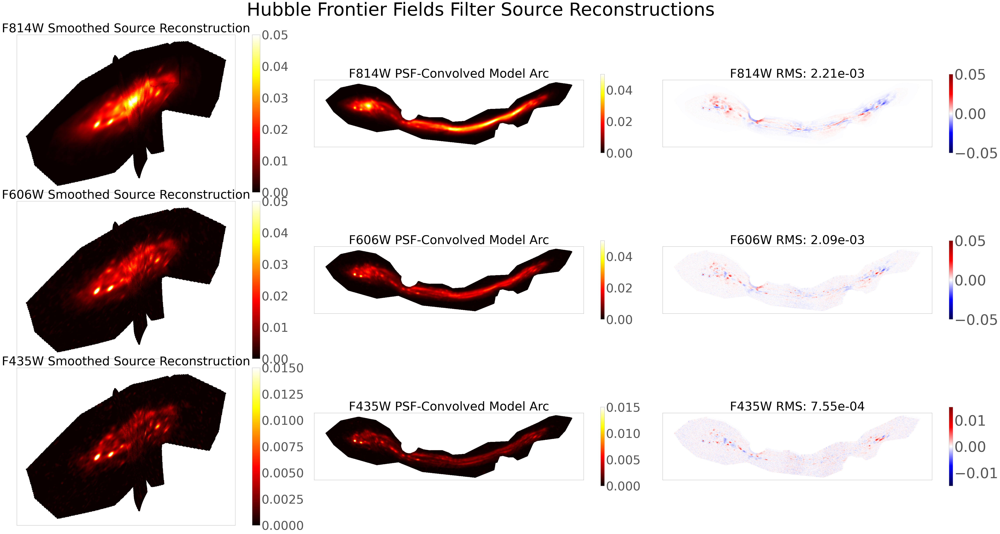

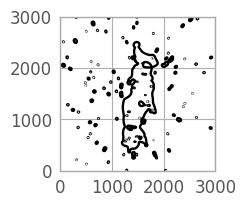

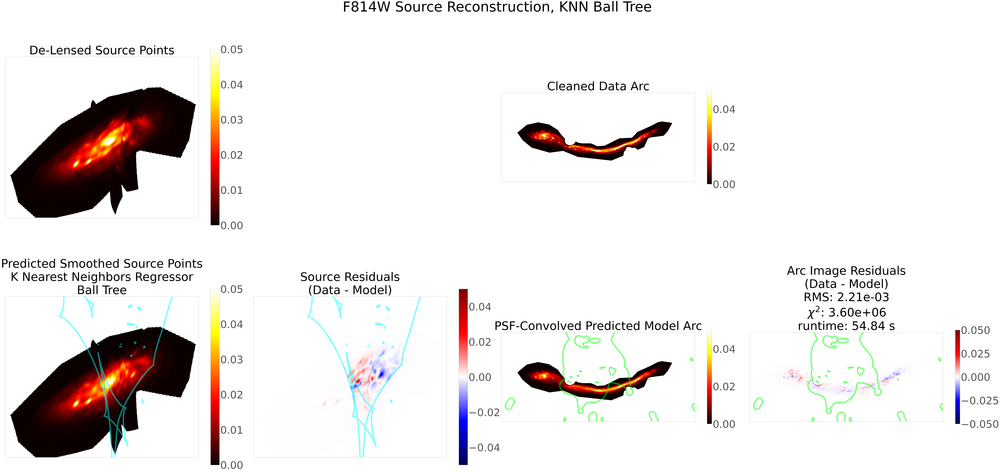

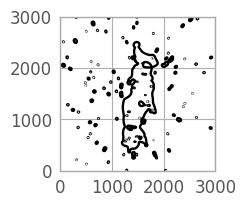

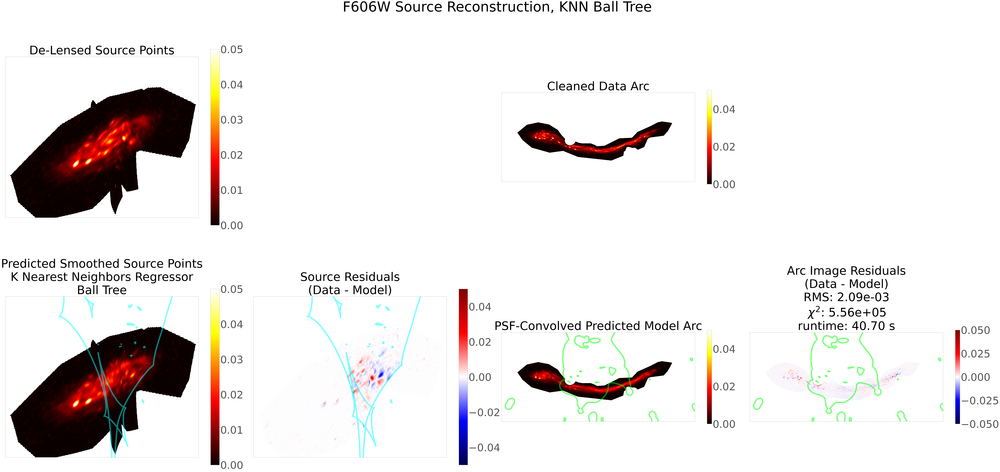

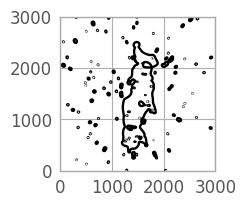

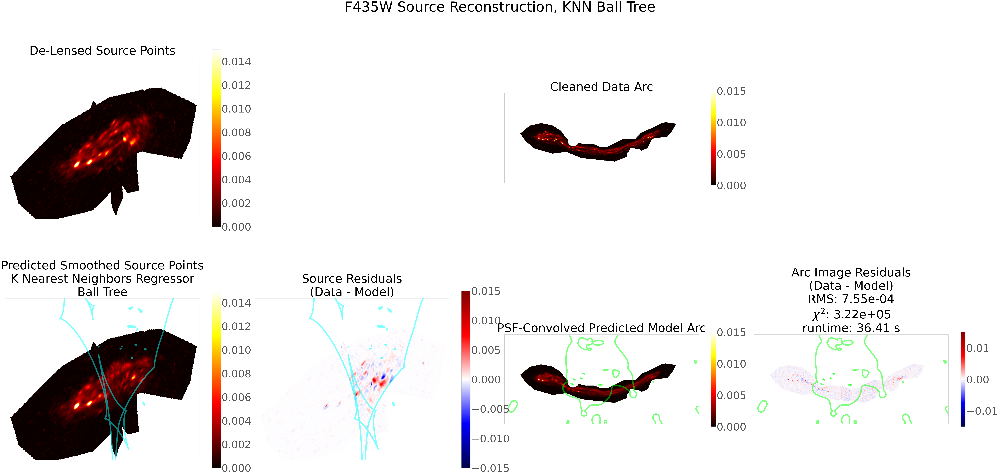

In [16]:
#want to make a giant plot using results from the subplots above, so want to include subplot in function above for 15/16/17
fig_a,ax_a = subplots(nrows=3,ncols=3,figsize=(60,30))
fig_a.suptitle("Hubble Frontier Fields Filter Source Reconstructions",fontsize=75,y=1.015)
fig_a.tight_layout()

#RED FILTER INPUTS: F814W FROM HUBBLE FRONTIER FIELDS (Lotz+2017)
#list of variables needed for the functions - this is for Abell 370 - original and for most maps
print("Abell 370 Giant Arc [HFF F814W]")
#FUNCTION: general lensing info
z_obs, z_lens, z_source, Dls_over_Dos, arc_path, grid_hdu, wcs_data, alphax, alphay, kappa, gamma, mu_mag_signed = read_in_and_scale_maps(z_obs0=0,z_lens0=0.375,z_source0=0.7251,input_folder_path='/mnt/c/Users/lana-/Desktop/SourceREACH/Input_Files',arc_path0='/data_arc_cutout_F814W.fits',alphax_0='/Abell370_OPT_alphax.fits',alphay_0='/Abell370_OPT_alphay.fits',kappa_0='/Abell370_OPT_kappa.fits',gamma_0='/Abell370_OPT_gamma.fits')
#FUNCTION: for rgb
model_bright_1Darr0_814, posu, posv, posx, posy = run_all(version=15,num_ne=6,arc_path0='/data_arc_cutout_F814W.fits',mock_yn=0,region_file_path0="/giant_arc_isolated.datamask.reg",fig_a=fig_a,ax_a=ax_a,filter_st_dev=0.0003764267,map_pix=3001,input_folder_path='/mnt/c/Users/lana-/Desktop/SourceREACH/Input_Files',psf_path='/psf_814.fits')

print("Abell 370 Giant Arc [HFF F606W]")
#FUNCTION: general lensing info
z_obs, z_lens, z_source, Dls_over_Dos, arc_path, grid_hdu, wcs_data, alphax, alphay, kappa, gamma, mu_mag_signed = read_in_and_scale_maps(z_obs0=0,z_lens0=0.375,z_source0=0.7251,input_folder_path='/mnt/c/Users/lana-/Desktop/SourceREACH/Input_Files',arc_path0='/data_arc_cutout_F606W.fits',alphax_0='/Abell370_OPT_alphax.fits',alphay_0='/Abell370_OPT_alphay.fits',kappa_0='/Abell370_OPT_kappa.fits',gamma_0='/Abell370_OPT_gamma.fits')
#FUNCTION: for rgb
model_bright_1Darr0_606, posu, posv, posx, posy = run_all(version=16,num_ne=6,arc_path0='/data_arc_cutout_F606W.fits',mock_yn=0,region_file_path0="/giant_arc_isolated.datamask.reg",fig_a=fig_a,ax_a=ax_a,filter_st_dev=0.0009032656,map_pix=3001,input_folder_path='/mnt/c/Users/lana-/Desktop/SourceREACH/Input_Files',psf_path='/psf_606.fits')

print("Abell 370 Giant Arc [HFF F435W]")
#FUNCTION: general lensing info
z_obs, z_lens, z_source, Dls_over_Dos, arc_path, grid_hdu, wcs_data, alphax, alphay, kappa, gamma, mu_mag_signed = read_in_and_scale_maps(z_obs0=0,z_lens0=0.375,z_source0=0.7251,input_folder_path='/mnt/c/Users/lana-/Desktop/SourceREACH/Input_Files',arc_path0='/data_arc_cutout_F435W.fits',alphax_0='/Abell370_OPT_alphax.fits',alphay_0='/Abell370_OPT_alphay.fits',kappa_0='/Abell370_OPT_kappa.fits',gamma_0='/Abell370_OPT_gamma.fits')
#FUNCTION: for rgb
model_bright_1Darr0_435, posu, posv, posx, posy = run_all(version=17,num_ne=6,arc_path0='/data_arc_cutout_F435W.fits',mock_yn=0,region_file_path0="/giant_arc_isolated.datamask.reg",fig_a=fig_a,ax_a=ax_a,filter_st_dev=0.00042957792,map_pix=3001,input_folder_path='/mnt/c/Users/lana-/Desktop/SourceREACH/Input_Files',psf_path='/psf_435.fits')



RGB Setup


In [17]:
#Create RGB images from the three filters' source reconstruction analysis
#specific to the shape of the image and source
def general_rgb_part(filter_color,scaling_percent,x_im,y_im,x_sr,y_sr,source_or_image):

    points = numpy.column_stack((x_im, y_im))
    points_sr = numpy.column_stack((x_sr, y_sr))
    nx_sr,ny_sr = 2000,3000
    x_grid_sr = numpy.linspace(1200,1400, nx_sr)
    y_grid_sr = numpy.linspace(900,1200, ny_sr)
    X_sr,Y_sr = numpy.meshgrid(x_grid_sr,y_grid_sr)

    nx, ny = 3001, 3001
    x_grid = numpy.arange(nx)
    y_grid = numpy.arange(ny)
    X, Y = numpy.meshgrid(x_grid, y_grid)
    if source_or_image=="image":
        Z_array = griddata(points, filter_color, (X, Y), method='nearest', fill_value=numpy.nan)
    if source_or_image=="source":
        Z_array = griddata(points_sr, filter_color, (X_sr,Y_sr), method='nearest', fill_value=numpy.nan)

    array_scale = numpy.nan_to_num(Z_array)
    scaled_model_py = numpy.clip((array_scale-numpy.percentile(numpy.nan_to_num(array_scale),1))/(numpy.percentile(numpy.nan_to_num(array_scale),scaling_percent)-numpy.percentile(numpy.nan_to_num(array_scale),1)),0,1)

    return scaled_model_py

###############################################################################

#source
r_scaled_model_py_sr = general_rgb_part(filter_color=model_bright_1Darr0_814,scaling_percent=99.92,x_im=posx,y_im=posy,x_sr=posu,y_sr=posv,source_or_image="source")
g_scaled_model_py_sr = general_rgb_part(filter_color=model_bright_1Darr0_606,scaling_percent=99.9,x_im=posx,y_im=posy,x_sr=posu,y_sr=posv,source_or_image="source")
b_scaled_model_py_sr = general_rgb_part(filter_color=model_bright_1Darr0_435,scaling_percent=99.89,x_im=posx,y_im=posy,x_sr=posu,y_sr=posv,source_or_image="source")
#image
r_scaled_model_py_im = general_rgb_part(filter_color=model_bright_1Darr0_814,scaling_percent=99.99,x_im=posx,y_im=posy,x_sr=posu,y_sr=posv,source_or_image="image")
g_scaled_model_py_im = general_rgb_part(filter_color=model_bright_1Darr0_606,scaling_percent=99.98,x_im=posx,y_im=posy,x_sr=posu,y_sr=posv,source_or_image="image")
b_scaled_model_py_im = general_rgb_part(filter_color=model_bright_1Darr0_435,scaling_percent=99.98,x_im=posx,y_im=posy,x_sr=posu,y_sr=posv,source_or_image="image")

###############################################################################

#same as other places, can redefine if needed
input_folder_path = '/mnt/c/Users/lana-/Desktop/SourceREACH/Input_Files'
wcs_data = WCS(fits.open(input_folder_path+'/data_arc_cutout_F814W.fits')[0].header)

masked_red_model = make_mask(array_to_mask=r_scaled_model_py_im,wcs_data0=wcs_data,region_file_path=input_folder_path+'/giant_arc_isolated.datamask.reg')
masked_green_model = make_mask(array_to_mask=g_scaled_model_py_im,wcs_data0=wcs_data,region_file_path=input_folder_path+'/giant_arc_isolated.datamask.reg')
masked_blue_model = make_mask(array_to_mask=b_scaled_model_py_im,wcs_data0=wcs_data,region_file_path=input_folder_path+'/giant_arc_isolated.datamask.reg')
rgb_model_py_im = make_lupton_rgb(masked_red_model, masked_green_model, masked_blue_model, Q=10, stretch=0.45)

#need to plot RGB
rgb_model_py_sr = make_lupton_rgb(r_scaled_model_py_sr, g_scaled_model_py_sr, b_scaled_model_py_sr, Q=4, stretch=0.85)
rgb_model_py_im = make_lupton_rgb(masked_red_model, masked_green_model, masked_blue_model, Q=5, stretch=0.85)



RGB with INFO

Dls_over_Dos =  0.43206991039039117


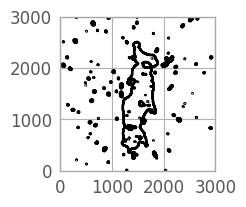

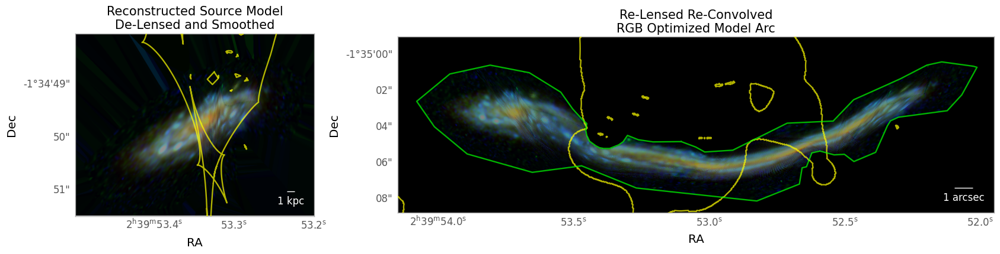

In [21]:
#make function where inputs are number of maps, folder, and PDF name
#not all these parameters are necessary - holdover from other plotting functions - edit as needed
def plot_all_FINAL_RGB(PDF_name,rgb_data,rgb_mps,z_obs,z_lens,z_source,Dls_over_Dos,arc_path,grid_hdu,wcs_data,alphax,alphay,kappa,gamma,mu_mag_signed,arc_path0,region_file_path0,map_pix,input_folder_path,output_folder_path,psf_path):

    with PdfPages(output_folder_path+str(PDF_name)) as pdf:

        ###################################################################################

        #FUNCTION: calculate critical curves + caustics
        allcrit, allcaus = get_mag_products(size_pix=map_pix)

        ###################################################################################

        #general path info
        wcs_data_red = WCS(fits.open(arc_path)[0].header)

        ###################################################################################

        # Extract the pixel scale from the FITS header
        header = fits.open(arc_path)[0].header
        header2 = fits.open(arc_path)[0].header
        pixscale_x = abs(header['CD1_1']) * 3600  # Convert degrees to arcseconds
        pixscale_y = abs(header['CD2_2']) * 3600  # Convert degrees to arcseconds

        # Find the contours where the magnification map switches between positive and negative
        contours = contour(mu_mag_signed, levels=[0], colors='black')

        # Interpolate the deflection maps
        x = numpy.arange(alphax.shape[1])
        y = numpy.arange(alphay.shape[0])
        x_alpha_interp = RectBivariateSpline(y, x, alphax)
        y_alpha_interp = RectBivariateSpline(y, x, alphay)

        # Calculate the scale in kpc/arcsec
        scale_kpc_per_arcsec_source = cosmo.kpc_proper_per_arcmin(z_source).to(astropy.units.kpc / astropy.units.arcsec)
        scale_kpc_per_arcsec_image = cosmo.kpc_proper_per_arcmin(z_lens).to(astropy.units.kpc / astropy.units.arcsec)
            
        ###################################################################################
        ###################################################################################

        rcParams['axes.grid'] = False

        #now plot
        fig = figure(figsize=(20,5))

        fig.tight_layout()
        gs = gridspec.GridSpec(1,2,width_ratios=[1,2.5])

        ax1 = subplot(gs[1], projection=wcs_data_red.celestial)
        ax1.grid(False)
        data_000_pixsrc          = ax1.imshow(rgb_data, origin='lower')
        ax1.set_title('Re-Lensed Re-Convolved\nRGB Optimized Model Arc',fontsize=15)
        ax1.set_xlim(875,1975)
        ax1.set_ylim(425,750)
        ax1.set_xlabel("RA")
        ax1.set_ylabel("Dec")
        
        ###################################################################################

        #add scale bar for 1 arcsecond
        scalebar_1 = add_scalebar(ax1, 1 * astropy.units.arcsec, label='1 arcsec', color='white', frame=False, borderpad=0.5, pad=0.5)

        #can edit this for other maps and models if needed - from the .reg file we used
        values = (39.9712713,-1.5846743,39.9710490,-1.5847577,39.9709100,-1.5848341,39.9704793,-1.5848063,39.9696429,-1.5843896,39.9689365,-1.5843574,39.9686216,-1.5840285,39.9681932,-1.5838366,39.9679014,-1.5837046,39.9674962,-1.5834952,39.9672678,-1.5834449,39.9667843,-1.5835116,39.9667259,-1.5835282,39.9669594,-1.5839532,39.9671836,-1.5841979,39.9679339,-1.5842979,39.9680547,-1.5843535,39.9681034,-1.5844313,39.9682840,-1.5848396,39.9686175,-1.5849813,39.9687633,-1.5848702,39.9689217,-1.5848785,39.9691385,-1.5848202,39.9692635,-1.5848480,39.9693469,-1.5850618,39.9694136,-1.5850785,39.9694553,-1.5853285,39.9701097,-1.5855896,39.9719605,-1.5853896,39.9728025,-1.5850479,39.9735611,-1.5851479,39.9745615,-1.5848646,39.9750658,-1.5844452,39.9753376,-1.5840532,39.9748282,-1.5836313,39.9742071,-1.5834952,39.9736069,-1.5836118,39.9731234,-1.5839118,39.9729400,-1.5841702,39.9727732,-1.5843535,39.9727232,-1.5843952,39.9727399,-1.5844952,39.9727232,-1.5845785,39.9726796,-1.5846689,39.9725840,-1.5847390,39.9725278,-1.5847681,39.9724638,-1.5847797,39.9723726,-1.5847797,39.9722350,-1.5847255,39.9721650,-1.5846769,39.9720980,-1.5845785,39.9719312,-1.5846452,39.9717062,-1.5846785,39.9712713,-1.5846743)
        # Initialize empty lists for x and y coordinates
        x_coords = []
        y_coords = []
        # Iterate through the values and separate them into x and y coordinates
        for i, value in enumerate(values):
            if i % 2 == 0:
                x_coords.append(value)
            else:
                y_coords.append(value)

        ###################################################################################

        #want to reproject just the magnification map onto the lensed model output and save it separately
        # Convert and preserve the contour structure
        reproj_contours = []
        for contour_segment in contours.allsegs[0]:
            # Extract contour points
            contour_points = numpy.array(contour_segment)
            # Convert pixel coordinates of the larger grid to world coordinates
            world_coords = WCS(header).pixel_to_world(contour_points[:,0], contour_points[:,1])
            # Convert world coordinates to pixel coordinates of the smaller grid
            pixel_coords = WCS(header2).world_to_pixel(world_coords)
            # Preserve the structure of the contours
            reproj_contours.append(pixel_coords)
        for segment in reproj_contours:
            ax1.plot(segment[0], segment[1], color='yellow', alpha=0.7)

        ###################################################################################

        # Convert RA and Dec to pixel coordinates
        pixel_coords = wcs_data_red.all_world2pix(x_coords, y_coords, 1)
        x_pixel = pixel_coords[0]
        y_pixel = pixel_coords[1]
        #add data mask
        ax1.plot(x_pixel,y_pixel,color="lime",alpha=0.7)
        ax1.grid(False)

        ###################################################################################

        ax3 = subplot(gs[0], projection=wcs_data_red.celestial)
        ax3.grid(False)

        #extent is left, right, bottom, top
        mps_000_pixsrc = ax3.imshow(rgb_mps, origin='lower', extent=[1200,1400,900,1200])
        ax3.set_title('Reconstructed Source Model\nDe-Lensed and Smoothed',fontsize=15)
        ax3.set_xlim(1200,1350)#1200,2500)#(100,1500)
        ax3.set_ylim(1000,1115)#1250,2250)#(1000,2100)
        ax3.set_xlabel("RA")
        ax3.set_ylabel("Dec")

        ###################################################################################
        ###################################################################################

        # Loop through all contours and delens each one
        for contour_segment in contours.allsegs[0]:
            ax3.grid(False)
            # Extract contour points
            contour_points = numpy.array(contour_segment)

            # Delens the contour points
            u = contour_points[:, 0] - x_alpha_interp.ev(contour_points[:, 1], contour_points[:, 0])
            v = contour_points[:, 1] - y_alpha_interp.ev(contour_points[:, 1], contour_points[:, 0])

            # Convert pixel coordinates of the larger grid to world coordinates
            world_coords = WCS(header).pixel_to_world(u, v)

            # Convert world coordinates to pixel coordinates of the smaller grid
            pixel_coords = wcs_data_red.world_to_pixel(world_coords)

            # Plot the delensed caustics on the smaller image
            # Plot contours in source-plane pixel coordinates
            ax3.plot(u,v, color='yellow', alpha=0.7)#u_idx, v_idx
            ax3.grid(False)

        ax3.set_xticks([])
        ax3.set_yticks([])

        ###################################################################################
        ###################################################################################

        #add scale bar
        #calculate scale in arcseconds per pixel
        pixel_scale = wcs_data_red.proj_plane_pixel_scales() * astropy.units.deg
        pixel_scale_arcsec = pixel_scale.to(astropy.units.arcsec)
        #add scale bar for 1 kiloparsec
        scalebar_source = add_scalebar(ax3, (1 / scale_kpc_per_arcsec_source).value * astropy.units.arcsec, label='1 kpc', color='white', frame=False, borderpad=0.5, pad=0.5)
        ax3.set_xticks([])
        ax3.set_yticks([])
        ax3.grid(False)

        ###################################################################################

        #save for the PDF
        pdf.savefig(bbox_inches='tight')


#combine and use the previously defined functions to overlay everything on the RGB + info
z_obs, z_lens, z_source, Dls_over_Dos, arc_path, grid_hdu, wcs_data, alphax, alphay, kappa, gamma, mu_mag_signed = read_in_and_scale_maps(z_obs0=0,z_lens0=0.375,z_source0=0.7251,input_folder_path='/mnt/c/Users/lana-/Desktop/SourceREACH/Input_Files',arc_path0='/data_arc_cutout_F814W.fits',alphax_0='/Abell370_OPT_alphax.fits',alphay_0='/Abell370_OPT_alphay.fits',kappa_0='/Abell370_OPT_kappa.fits',gamma_0='/Abell370_OPT_gamma.fits')
plot_all_FINAL_RGB(PDF_name='/UpdatedRGB.pdf',rgb_data=rgb_model_py_im,rgb_mps=rgb_model_py_sr,z_obs=z_obs,z_lens=z_lens,z_source=z_source,Dls_over_Dos=Dls_over_Dos,arc_path=arc_path,grid_hdu=grid_hdu,wcs_data=wcs_data,alphax=alphax,alphay=alphay,kappa=kappa,gamma=gamma,mu_mag_signed=mu_mag_signed,arc_path0='/data_arc_cutout_F814W.fits',region_file_path0="/giant_arc_isolated.datamask.reg",map_pix=3001,input_folder_path='/mnt/c/Users/lana-/Desktop/SourceREACH/Input_Files',output_folder_path='/mnt/c/Users/lana-/Desktop/SourceREACH/Output_Files',psf_path='/psf_814.fits')


# NOTES

Note that we can use the previously defined functions to output FITS file versions of the source reconstruction (and more easily for the lensed giant arc model), but a source plane gridding scheme and interpolation to desired resolution would need to be defined first, due to the varying source plane resolution from de-lensing.  